# Analysing the Datasets
Before classifying the datasets, we analyze them quantitatively and qualitatively.

The quantitative analysis includes inspecting the class distributions, the text lengths of titles and abstracts, and of the number of duplicates per dataset. The datasets were qualitatively analyzed by manually scanning through articles and pairs of duplicate articles and looking for patterns. The qualitative analysis surrounds the types of duplicate article pairs, distinct types of noise, and word cloud analysis.

## Custom Modules
The ``src`` directory houses custom modules with functions that will be reused throughout the project.

To be able to import these moduls, we begin with programmatically adding the project's root directory to ``sys.path``.

After adding the root to ``sys.path``, we can import the ``data`` and ``util`` modules:

In [1]:
import os, sys

# recursively search for the root directory containing a specific file
def find_root_dir(search_for='.gitignore'):

    current_dir = os.getcwd()

    while True:
        if os.path.exists(os.path.join(current_dir, search_for)):
            return current_dir
        parent_dir = os.path.dirname(current_dir)
        if parent_dir == current_dir:
            raise FileNotFoundError(f"Could not find '{search_for}' in any parent directory.")
        current_dir = parent_dir


# save the root directory to a variable
root_dir = find_root_dir()
print(f"Root directory found: {root_dir}")

# add the root directory to the system path
sys.path.append(root_dir)
if root_dir in sys.path:
    print(f"Root directory added to system path.")


# import custom modules
from src import data

Root directory found: c:\dev\automated_title_abstract_screening
Root directory added to system path.


## Preparation
### Imports

### Loading the Data

In [3]:
# where to load the data from
# we are analyzing the data prior to the preprocessing
# thus after retrieving metadata from PubMed eutils
data_directory = '../../../data/datasets/03_pubmed'

# load datasets in polars (default) and pandas
datasets = data.dict_from_directory(
    data_directory, 
    type='polars',
    with_index=True
)

datasets_pandas = data.dict_from_directory(
    data_directory,
    type='pandas',
)

In [4]:
import polars as pl

# to quickly access the dataframes which live in the dictionary
adhd = datasets['adhd']
animal_depression = datasets['animal_depression']
atypical_antipsychotics = datasets['atypical_antipsychotics']
calcium_channel_blockers = datasets['calcium_channel_blockers']
oral_hypoglycemics = datasets['oral_hypoglycemics']

# combine all datasets into one single polars DataFrame
all_datasets = pl.DataFrame(
)

for subject, dataset in datasets.items():
    all_datasets = all_datasets.vstack(dataset.with_columns(pl.lit(subject).alias('dataset')))

### Helper Functions
Here, we define some logic which we encapsulate in helper functions that we will use throughout this notebook:

In [5]:
from typing import List

def return_rows(
    df: pl.DataFrame,
    index: List[int] | int,
    columns: List[str] | str = 'abstract'
    ) -> pl.DataFrame:
        """
        Return a selection of rows from a dataframe based on indices and columns.

        Args:
            df (pl.DataFrame): The dataframe to select from.
            index (List[int] | int): The index or indices of the rows to select.
            columns (List[str] | str): The column or columns to select. Defaults to 'abstract'.
        
        Returns:
            pl.DataFrame: A dataframe containing the selected rows and columns.
        """
        # ensure index is always a list or collection
        if isinstance(index, int):
            index = [index]
        return df.filter(
            pl.col('index').is_in(index)
        ).select(columns)

In [ ]:
from typing import Tuple

def print_abstracts(
        rows: List[Tuple[pl.DataFrame, List[int]]],
        columns: List[str] | str = 'abstract',
        character_limit: int | None = 200,
        abstract_only=True
    ) -> None:

    """
    Print abstracts based on given dataframes and indices.

    Args:
        rows (List[Tuple[pl.DataFrame, List[int]]]): A list of tuples containing the dataframe and the indices of the rows to select.
        columns (List[str] | str): The column or columns to select. Defaults to 'abstract'.
        character_limit (int | None): The maximum number of characters to print for each abstract. Defaults to 200.
        abstract_only (bool): If True, only print the abstracts. Defaults to True.

    Returns:
        None: This function prints the abstracts directly.
    """

    for row in rows:
        abstracts = return_rows(row[0], row[1], columns)

        if abstract_only:
            abstracts = abstracts['abstract']

        for abstract in abstracts:
            print(abstract[:character_limit], end='\n\n')

In [7]:
import random

# color codes to use within the notebook
COLOR_CODES = ['#004A71', '#009EE0', '#EC963E', '#34B2A6', '#797B7F', '#2CA02C']

# from a list of colors used in the manuscript, return a random color
# arguments are required as per the word_cloud package
def get_random_color(word=None, 
                     font_size=None, 
                     position=None, 
                     orientation=None, 
                     font_path=None, 
                     random_state=None,
                    ) -> str:
    """
    Return a random color from a predefined list of colors.

    Args:
        None: The arguments are simply to match the expected signature for word cloud generation.

    Returns:
        str: A random color from the predefined list.
    """

    # list of colors to use within the word clouds
    colors: List[str] = ['#004A71', '#009EE0', '#EC963E', '#34B2A6']
    return random.choice(colors)

In [8]:
import nltk, pandas as pd
from wordcloud import WordCloud
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

# word_cloud_from_dataframe requires the nltk stopwords
nltk.download('stopwords')
nltk.download('wordnet')

# create a word based on a given dataframe and columns
def word_cloud_from_dataframe(
          dataframe: pl.DataFrame, 
          columns: List[str] | str
        ) -> WordCloud:
    
    """
    Create a word cloud from a given dataframe and columns.
    This function generates a word cloud from the text data in the specified columns of a dataframe.

    Args:
        dataframe (pl.DataFrame): The dataframe containing the text data.
        columns (List[str] | str): The column or columns to use for generating the word cloud.

    Returns:
        WordCloud: A WordCloud object generated from the text data in the specified columns.
    """
    
    # ensure columns is always a list or collection
    if isinstance(columns, str):
        columns = [columns]

    # create one big string that contains all words within the dataframe
    corpus = ' '.join(
        [word for column in columns for word in dataframe[column] 
        if word is not None]
    )

    # stop words from the natural language toolkit corpus
    stop_words = stopwords.words('english')


    # add special characters to the list of stop words
    special_characters = ['.', ',', '(', ')', '[', ']', '{', '}', ':', ';',
                          '?', '!', '@', '#', '$', '%', '^', '&', '*', '+', 
                          '=', '<', '>', '/', '\\', '|', '~', '`', '_', '-'
                          ]
    stop_words.extend(special_characters)

    # stop words that frequently appear in the datasets but not in nltk
    custom_stop_words = ['patient', 'treatment', 'study', 'group', 'effect', 
                         'p', 'mg', 'conclusion', 'day', 'week', 'result', 
                         'compared', 'use', 'one', 'also', 'two', 'may', 
                         'level', 'however', 'm', 'd', 'period', 'n'
                        ]
    stop_words.extend(custom_stop_words)

    # tokenize the corpus to create a list of words within the dataframe
    word_tokens = word_tokenize(corpus.lower())

    # remove stop words
    filtered = [word for word in word_tokens if word not in stop_words]

    # lemmatize
    lemmatizer = WordNetLemmatizer()
    lemmatized = [lemmatizer.lemmatize(word) for word in filtered]


    return WordCloud(
        scale=20, # size of the word cloud
        collocations=False,  # whether to includes bigrams
        background_color="rgba(255, 255, 255, 0)", # transparent background
        stopwords=custom_stop_words, 
        mode='RGBA', # transparent background
        color_func=get_random_color
    ).generate_from_text(' '.join(lemmatized)) # generate the word cloud


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\mfaig\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\mfaig\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [9]:
from matplotlib import pyplot as plt

# display a word cloud together with a title
def plot_word_cloud(cloud, title=''):
    """"
    Display a word cloud together with a title.

    Args:
        cloud (wordcloud.WordCloud): The word cloud to display.
        title (str): The title of the plot. Defaults to an empty string.
    
    Returns:
        None: This function displays the word cloud plot.
    """


    plt.figure(figsize=(10, 10), dpi=400)
    plt.imshow(cloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(title)
    plt.show()

## Distribution of Class Labels
Title/Abstract-Screening is usally a highly imbalanced task, meaning that the number of excluded articles significantly outweights the number of included articles.

Here, we inspect the distribution of included and excluded articles:

In [10]:
# create nested lists of inlcudes and excludes
# each list contains the includes or excludes for each dataset
includes = [dataset.filter(
    pl.col('include') == True
) for dataset in datasets.values()]

excludes = [dataset.filter(
    pl.col('include') == False
) for dataset in datasets.values()]

# calculate absolute and relative number of includes and excludes
includes_absolute = [len(include) for include in includes]
excludes_absolute = [len(exclude) for exclude in excludes]

includes_relative = [round(include / len(dataset), 4) * 100 for include, dataset in zip(includes_absolute, datasets.values())]
excludes_relative = [round(exclude / len(dataset), 4) * 100 for exclude, dataset in zip(excludes_absolute, datasets.values())]

In [11]:
# organize the label distributions in a DataFrame
distributions_labels = pl.DataFrame({
    'dataset': list(datasets.keys()),
    'include %': includes_relative,
    'exclude %': excludes_relative,
    'include': includes_absolute,
    'exclude': excludes_absolute,
    'rows': [len(dataset) for dataset in datasets.values()],
})

In [12]:
dataset_labels = [
    'ADHD', 
    'Animal Depression', 
    'Atypical Antipsychotics', 
    'Calcium Channel Blockers', 
    'Oral Hypoglycemics', 
    'Pancreatic Surgery'
]

In [13]:
# melt the DataFrame into long format for plotting
melted = distributions_labels.unpivot(
    index=['dataset'], 
    on=['include %', 'exclude %'],
).sort(by='value')

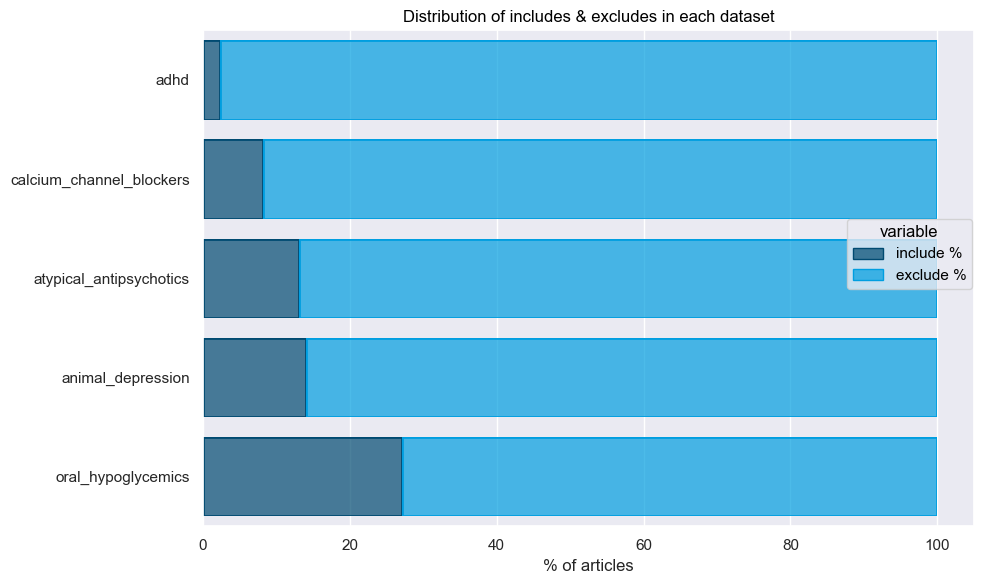

dataset,include %,exclude %,include,exclude,rows
str,f64,f64,i64,i64,i64
"""adhd""",2.35,97.65,20,831,851
"""calcium_channel_blockers""",8.21,91.79,100,1118,1218
"""atypical_antipsychotics""",13.04,86.96,146,974,1120
"""animal_depression""",14.05,85.95,280,1713,1993
"""oral_hypoglycemics""",27.04,72.96,136,367,503


<Figure size 640x480 with 0 Axes>

In [14]:
import seaborn.objects as so
from seaborn import color_palette

# plot the distributions of includes and excludes per dataset
plot = (
    so.Plot(data=melted, y='dataset', x='value', color='variable')
    .add(so.Bar(), so.Stack())
    .label(
        y='', 
        x='% of articles', 
        title='Distribution of includes & excludes in each dataset'
    )
    .layout(size=(10, 6))
    .scale(color=so.Nominal(color_palette(COLOR_CODES[:2])))
)

# show the plot in this notebook
plot.show()

# save the plot to a file
plt.savefig('includes_excludes.svg', dpi=300)

# show the sorted distributions as a table
distributions_labels.sort(by=pl.col('include %'))

### Conclusion: Class Labels
Title/Abstract-screening is a heavily imbalanced task. The datasets provide a variety of include ratios, ranging from 2 to 27 percent.

## Text Lengths (Number of Words)
During our first, manual inspection that there are both very short and very long abstracts within the datasets.

We therefore define a function to calculate the distribution of word counts:

In [ ]:
def calculate__word_distributions(
        dataframe: pl.DataFrame,
        subjecct: str,
        columns: List[str] | str
) -> pl.DataFrame:
    """
    Calculate the distributions of the given columns in the dataframe.
    
    Args:
        dataframe (pl.DataFrame): The dataframe to calculate the distributions for.
        subject (str): The subject of the dataset.
        columns (List[str] | str): The columns to calculate the distributions for.
        
    Returns:
        pl.DataFrame: A DataFrame with the calculated distributions.
    """
    # ensure columns is always a list or collection
    if isinstance(columns, str):
        columns = [columns]

    # empty DataFrame to store the distributions in 
    distributions_words = pl.DataFrame(
        schema=pl.Schema(
            [
                ('column', pl.String),
                ('type', pl.String),
                ('n', pl.Int64),
                ('mean', pl.Int64),
                ('std', pl.Int64),
                ('min', pl.Int64),
                ('5%', pl.Int64),
                ('25%', pl.Int64),
                ('50%', pl.Int64),
                ('75%', pl.Int64),
                ('95%', pl.Int64),
                ('99%', pl.Int64),
                ('max', pl.Int64),
                ('dataset', pl.String)
            ]
        )
    )

    # The numbe of articles in the dataset
    n = dataframe.height

    # iterate over the columns
    for column in columns:
        # check if the column exists in the dataframe
        if column not in dataframe.columns:
            print(f"Column '{column}' does not exist in the dataframe.")
            continue

        # tokenize each column
        tokens = [word_tokenize(x) if x is not None else [] for x in dataframe[column].to_list()]

        # create a list of the lengths of the tokens
        word_lengths = pl.Series([len(x) if x is not None else 0 for x in tokens])

        # calculate mean, standard deviation, min, quantiles, and max
        def safe_int(val, default=0):
            return int(val) if val is not None else default

        # calculate the statistics
        mean = safe_int(word_lengths.mean())
        std = safe_int(word_lengths.std())
        min = safe_int(word_lengths.min())
        q5 = safe_int(word_lengths.quantile(0.05))
        q25 = safe_int(word_lengths.quantile(0.25))
        q50 = safe_int(word_lengths.quantile(0.50))
        q75 = safe_int(word_lengths.quantile(0.75))
        q95 = safe_int(word_lengths.quantile(0.95))
        q99 = safe_int(word_lengths.quantile(0.99))
        max = safe_int(word_lengths.max())

        # create a new row with the calculated values
        row = pl.DataFrame(
            {
                'column': column,
                'type': 'word_length',
                'n': n,
                'mean': mean,
                'std': std,
                'min': min,
                '5%': q5,
                '25%': q25,
                '50%': q50,
                '75%': q75,
                '95%': q95,
                '99%': q99,
                'max': max,
                'dataset': subjecct

            }
        )


        # append the row to the distributions DataFrame
        distributions_words = pl.concat([distributions_words, row])

    return distributions_words

Next, we apply the function and save the distributions in a newly created, and accordingly formatted, DataFrame:

In [16]:
# create an empty DataFrame to store the distributions
distributions_words = pl.DataFrame(
    schema=pl.Schema(
        [
            ('column', pl.String),
            ('type', pl.String),
            ('n', pl.Int64),
            ('mean', pl.Int64),
            ('std', pl.Int64),
            ('min', pl.Int64),
            ('5%', pl.Int64),
            ('25%', pl.Int64),
            ('50%', pl.Int64),
            ('75%', pl.Int64),
            ('95%', pl.Int64),
            ('99%', pl.Int64),
            ('max', pl.Int64),
            ('dataset', pl.String)
        ]
    )
)

# calculate the distributions for each dataset and add them to one DataFrame
for subject, dataset in datasets.items():
    dist = calculate__word_distributions(dataset, subject, ['title', 'abstract'])
    
    distributions_words = distributions_words.vstack(dist)

distributions_words = pl.DataFrame(distributions_words)

Now we can inspect the distribution of words in tabular format before we move onto plotting them:

In [17]:
distributions_words

column,type,n,mean,std,min,5%,25%,50%,75%,95%,99%,max,dataset
str,str,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,str
"""title""","""word_length""",851,13,5,1,5,10,13,17,23,30,47,"""adhd"""
"""abstract""","""word_length""",851,275,334,0,99,182,249,311,454,724,5411,"""adhd"""
"""title""","""word_length""",1993,14,6,0,5,11,14,18,26,34,64,"""animal_depression"""
"""abstract""","""word_length""",1993,210,253,0,0,128,210,277,376,545,5414,"""animal_depression"""
"""title""","""word_length""",1120,12,5,1,5,9,12,16,23,29,47,"""atypical_antipsychotics"""
"""abstract""","""word_length""",1120,273,376,0,68,171,232,295,446,1281,5411,"""atypical_antipsychotics"""
"""title""","""word_length""",1218,15,7,1,5,11,15,20,27,34,78,"""calcium_channel_blockers"""
"""abstract""","""word_length""",1218,291,295,0,49,206,278,334,463,921,4999,"""calcium_channel_blockers"""
"""title""","""word_length""",503,15,6,1,5,10,15,19,27,36,41,"""oral_hypoglycemics"""


### Lengths of Titles
We move on by inspecting the number of words per title:

In [18]:
# look at only the rows from the title colum
distributions_words.filter(
    pl.col('column') == 'title'
)

column,type,n,mean,std,min,5%,25%,50%,75%,95%,99%,max,dataset
str,str,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,str
"""title""","""word_length""",851,13,5,1,5,10,13,17,23,30,47,"""adhd"""
"""title""","""word_length""",1993,14,6,0,5,11,14,18,26,34,64,"""animal_depression"""
"""title""","""word_length""",1120,12,5,1,5,9,12,16,23,29,47,"""atypical_antipsychotics"""
"""title""","""word_length""",1218,15,7,1,5,11,15,20,27,34,78,"""calcium_channel_blockers"""
"""title""","""word_length""",503,15,6,1,5,10,15,19,27,36,41,"""oral_hypoglycemics"""


How many words are there per title on average?

In [19]:
# average the number of words in the title column
median_title_words = distributions_words.filter(
    pl.col('column') == 'title'
).select(
    pl.col('50%').median()
).to_series()[0]

print(f'Across all datasets, a title contains a median of {median_title_words} words.')

Across all datasets, a title contains a median of 14.0 words.


Plot the lengths of the titles per dataset:

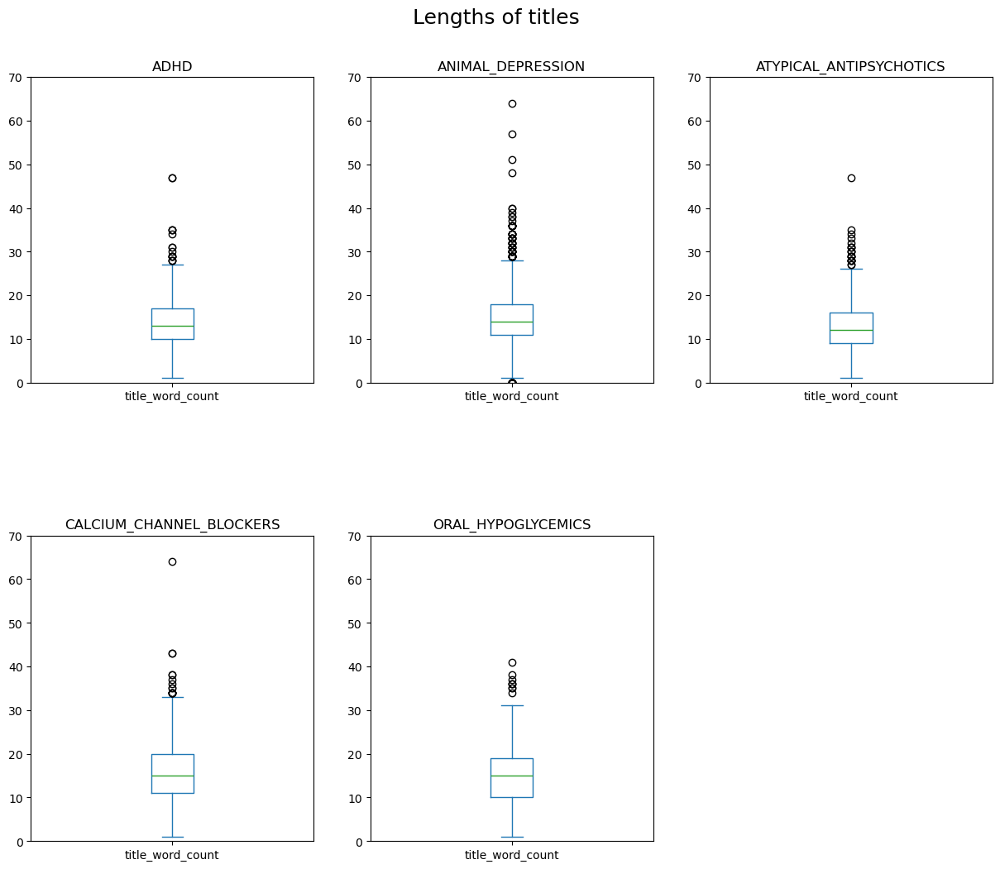

In [20]:
import seaborn as sns

# create a figure to plot the distributions of the title lengths
plt.figure(figsize=(15, 12))
plt.subplots_adjust(hspace=0.5)
plt.suptitle("Lengths of titles", fontsize=18, y=0.95)

# loop through the length of tickers and keep track of index
for n, (subject, df) in enumerate(datasets.items()):

    # transform df to pandas for plotting
    df = df.to_pandas()

    # add a new subplot iteratively
    ax = plt.subplot(2, 3, n + 1)

    # filter df and plot on the new subplot axis
    df['title_word_count'].plot(kind='box', ax=ax)

    # chart formatting
    ax.set_title(subject.upper())
    ax.set_ylim(0, 70)  # set y-axis limits uniform axes
    ax.set_xlabel("")

### Lengths of Abstracts
Next, we count the number of words within abstracts per dataset:

In [21]:
# inspect the distributions for the abstract column
distributions_words.filter(
    pl.col('column') == 'abstract'
)

column,type,n,mean,std,min,5%,25%,50%,75%,95%,99%,max,dataset
str,str,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,str
"""abstract""","""word_length""",851,275,334,0,99,182,249,311,454,724,5411,"""adhd"""
"""abstract""","""word_length""",1993,210,253,0,0,128,210,277,376,545,5414,"""animal_depression"""
"""abstract""","""word_length""",1120,273,376,0,68,171,232,295,446,1281,5411,"""atypical_antipsychotics"""
"""abstract""","""word_length""",1218,291,295,0,49,206,278,334,463,921,4999,"""calcium_channel_blockers"""
"""abstract""","""word_length""",503,296,266,0,82,213,288,352,490,684,5190,"""oral_hypoglycemics"""


How many words do the abstracts from each dataset contain on average?

In [22]:
# average the number of words in the abstract column
median_abstract_words = distributions_words.filter(
    pl.col('column') == 'abstract'
).select(
    pl.col('50%').median()
).to_series()[0]

print(f'Across all datasets, an abstract contains a median of {median_abstract_words} words.')

Across all datasets, an abstract contains a median of 249.0 words.


Plot the average number of words within the abstracts of each dataset:

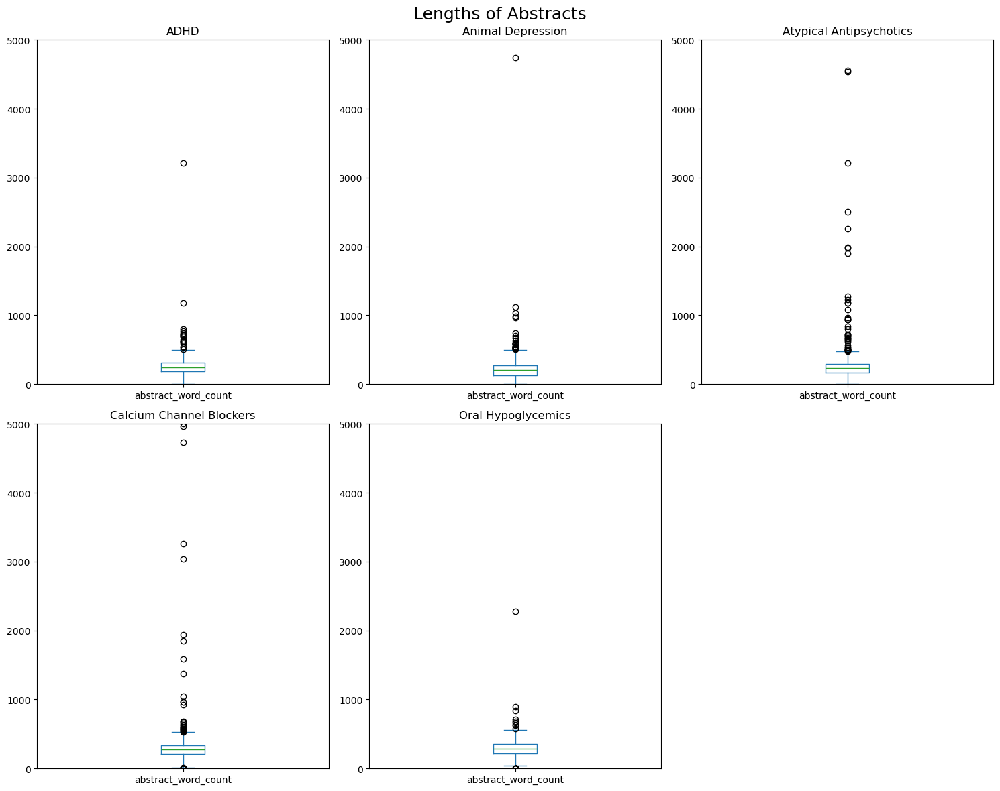

In [23]:
# create a figure to plot the distributions of the title lengths
plt.figure(figsize=(15, 12))
plt.subplots_adjust(hspace=0.5)
plt.suptitle("Lengths of Abstracts", fontsize=18)

# loop through the length of tickers and keep track of index
for n, (subject, df) in enumerate(datasets.items()):

    # transform df to pandas for plotting
    df = df.to_pandas()

    # add a new subplot iteratively
    ax = plt.subplot(2, 3, n + 1)

    # filter df and plot on the new subplot axis
    df['abstract_word_count'].plot(kind='box', ax=ax)

    # chart formatting
    ax.set_title(dataset_labels[n])
    ax.set_ylim(0, 5000)
    ax.set_xlabel("")

plt.tight_layout()

### Outliers: Extremely long or short texts
The analysis confirms what we had seen before when manually inspecting the datasets:
There are both extremely short and extremely long abstracts within the datasets.

Here, we want to filter and observe some of these texts, to see whether they are complete, cut off, or polluted with texts other than abstracts:

#### Outliers: Extremely Short Abstracts

In [24]:
MIN_WORDS = 1 # minimum number of words in an abstract; 1 to exclude empty
MAX_WORDS = 40 # maximum number of words in an abstract
SAMPLE_SIZE = 20 # how many examples to display

# dataframe of very short abstracts
very_short_abstracts = all_datasets.filter(
    pl.col('abstract_word_count') >= MIN_WORDS
).filter(
    pl.col('abstract_word_count') <= MAX_WORDS
)

# create lists for printing
very_short_abstracts_list = very_short_abstracts.select(pl.col('abstract')).to_series().to_list()
very_short_abstract_length_list = very_short_abstracts.select(pl.col('abstract_word_count')).to_series().to_list()
very_short_abstract_title_list = very_short_abstracts.select(pl.col('title')).to_series().to_list()

# combine the abstract length, title, and abstract into tuples
very_short_abstract_tuples = list(zip(very_short_abstract_length_list, very_short_abstract_title_list, very_short_abstracts_list))

# print the short abstracts
print(f'{len(very_short_abstracts)} VERY SHORT ABSTRACTS FOUND.', f'Displaying {SAMPLE_SIZE} samples per dataset', sep='\n', end=f'\n{'='*250}\n\n')

# formatting to distinguish open from closed sentences
for tuple in very_short_abstract_tuples:
    text_end = 'closed sentence' if tuple[2].endswith('.') else 'OPEN sentence'
    print(f'{tuple[1]} ({tuple[0]} words - {text_end})', tuple[2], sep=f'\n\n', end=f'\n\n{'-'*250}\n\n')

50 VERY SHORT ABSTRACTS FOUND.
Displaying 20 samples per dataset

Dosing Strategies of Clozapine-Fluvoxamine Cotreatment (26 words - OPEN sentence)

Lu, Mong-Liang MD, MS; Lane, Hsien-Yuan MD, PhD; Jann, Michael W. PharmD; Chang, Wen-Ho MD Author Information

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Desmopressin for Risperidone-Induced Enuresis (19 words - closed sentence)

AbstractWe present a case report which illustrates the successful use of desmopressin for the treatment of risperidone-induced enuresis.

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Stability of neurologi

#### Outliers: Extremely Long Abstracts

In [25]:
# to filter abstracts with more than words than the threshold
LONG_ABSTRACT_THRESHOLD = 4000

long_abstracts = all_datasets.filter(
    pl.col('abstract_word_count') > LONG_ABSTRACT_THRESHOLD
)

# create lists for printing
long_abstracts_list = long_abstracts.select(pl.col('abstract')).to_series().to_list()
long_abstract_length_list = long_abstracts.select(pl.col('abstract_word_count')).to_series().to_list()
_long_abstract_title_list = long_abstracts.select(pl.col('title')).to_series().to_list()

# combine the abstract length, title, and abstract into tuples
long_abstract_tuples = list(zip(long_abstract_length_list, _long_abstract_title_list, long_abstracts_list))

# print the long abstracts
print(len(long_abstract_tuples), 'LONG ABSTRACTS FOUND.', end=f'\n{'='*250}\n\n')

# formatting to distinguish open from closed sentences
for tuple in long_abstract_tuples:
    print(f'{tuple[1]} ({tuple[0]} words)', tuple[2], sep=f'\n\n', end=f'\n\n{'-'*250}\n\n')

16 LONG ABSTRACTS FOUND.

Bupropion Sustained Release for Treatment of Tobacco Dependence (5053 words)

Tobacco use is a global pandemic. The most common pharmacological treatments of tobacco use and dependence include nicotine replacement therapy and nonnicotine medications. Bupropion sustained release (SR) is the only first-line nonnicotine medication recommended by the US Public Health Service Clinical Practice Guideline. Randomized controlled clinical trials have shown that bupropion SR doubles abstinence rates compared with placebo. Long-term treatment with bupropion SR may reduce or delay smoking relapse. Bupropion SR has an excellent adverse effect profile, although a risk exists for serious adverse effects such as seizures. The risk of serious adverse effects associated with bupropion SR can be reduced by careful selection of patients. This article reviews the evidence of efficacy and common adverse effects of bupropion SR and delineates the clinical characteristics of patients

### Conclusion: Text Lengths
Most titles have around 13.5 words, while a few titles have up to 88 words. On average, abstracts contain 240 words across all datasets. 

Most outliers among the abstracts are within the range between 2000 and 5000 words, while one extreme outlier contains almost 80.000 words. There are also abstracts that contain one word only.
There are very short abstracts that are clearly cut-off and incomplete, and there are very long abstracts, that contain text other than the actual abstract.

## Duplicates
Duplicates emphasize the influence of duplicate articles on the class prediction when training supervised machine learning models.
They also manipulate the evaluation, as duplicate articles contribute double as much to the calculated performance as other ones.

We therefore want find out, whether there are duplicates within the datasets, and get rid of them, if we find any.

### Number of Duplicates
First, we begin by searching for duplicates and counting the number found.
We mainly use the identifiers for this, but also search for identical titles:

In [26]:
identical_entries = pl.DataFrame() # empty DataFrame to store identical entries

# columns based on which to search for duplicates
columns = [
    'doi', 
    'pubmed_id', 
    'openalex_id', 
    'webofscience_id', 
    'central_id', 
    'title'
]

# search for duplicates in each dataset
for group in all_datasets.group_by(by='dataset'):
    # the dataframe is the second element in the group
    df = group[1]

    # search for duplicates in each column
    for column in columns:
        
        # subset of duplicate articles
        clones = df.filter(
            pl.col(column).is_not_null() # exclude empty entries
        ).filter(
            pl.col(column).is_duplicated() # find duplicates
        ).sort(
            by=column # sort by the column
        ).unique( # display each unique value only once
            subset=column,
            keep='first',
            maintain_order=True
        ).with_columns(
            pl.lit(column).alias('duplicate_column')
        )

        # append the found duplicates to the identical entries
        if len(clones) > 0:
            identical_entries = identical_entries.vstack(clones)


Next, we print a summary of how many duplicate articles have been found within each dataset, and by which column:

In [27]:
# print a summary on duplicate articles in total and per dataset
print(f'Found {len(identical_entries)} identical entries across all datasets', 
      end=f'\n{'='*100}\n\n'
    )

# print a summary on how many duplicates there are per column
for group in identical_entries.group_by(by='dataset'):
    dataset = group[0][0] # dataset name, or subject
    dataframe = group[1] # the DataFrame itself
    
    # count the number of duplicates per column
    value_counts = dataframe['duplicate_column'].to_pandas().value_counts()

    # print the summary
    print(
        dataset, 
        'has', 
        len(dataframe),
        'identical entries by the following columns:'
    )
    print(value_counts, end='\n\n')
    

Found 19 identical entries across all datasets

atypical_antipsychotics has 4 identical entries by the following columns:
duplicate_column
title    4
Name: count, dtype: int64

calcium_channel_blockers has 1 identical entries by the following columns:
duplicate_column
title    1
Name: count, dtype: int64

animal_depression has 9 identical entries by the following columns:
duplicate_column
title          4
doi            2
openalex_id    2
pubmed_id      1
Name: count, dtype: int64

adhd has 1 identical entries by the following columns:
duplicate_column
title    1
Name: count, dtype: int64

oral_hypoglycemics has 4 identical entries by the following columns:
duplicate_column
title    4
Name: count, dtype: int64



### Types of Duplicates
Through manual inspection we found that there are different types of duplicates:

#### Same article published twice

> **Missing Note**
>
> There were examples of the same articles that had been published multiple times in different journals within the ``pancreatic_surgery`` data, which we unfortunately can not publish.

We can, however, show an example of two such articles:


![alt text](duplicates.png "Title")

#### Same article present twice
This example shows two references from the ``animal_depression`` dataset that refer to the very same article:

In [28]:
# manually sampled indices of two instances from a duplicate article
same_duplicate_entries = [
    (animal_depression, [615, 705])
]

# return the rows of the same duplicate entries
same_duplicate_entries = pl.concat([
    return_rows(
        row[0],
        row[1],
        columns=[
            'title',
            'abstract',
            'first_author',
            'journal',
            'year',
            'doi',
            'pubmed_id'
        ]
    ) for row in same_duplicate_entries
]).sort(
    by='title',
    descending=True
)

# print the same duplicate entries
same_duplicate_entries

title,abstract,first_author,journal,year,doi,pubmed_id
str,str,str,str,i64,str,i64
"""Design and Synthesis of Novel …","""Serotonin antagonist reuptake …","""Seo HJ""","""J Med Chem""",2011,"""https://doi.org/10.1021/jm2006…",21823597
"""Design and Synthesis of Novel …","""Serotonin antagonist reuptake …","""Seo HJ""","""J Med Chem""",2011,"""https://doi.org/10.1021/jm2006…",21823597


#### Same title but different articles
Another case are articles that share a title but are clearly distinguishable through their content, doi and literature id.

In [29]:
duplicates_different_article = [
    (oral_hypoglycemics, [178,179])
]

different_articles = pl.concat([
    return_rows(row[0], row[1], columns=[
        'title',
        'abstract', 
        'first_author',
        'journal', 
        'year', 
        'doi',
        'pubmed_id'
    ])
    for row in duplicates_different_article
]).sort(by='title', descending=True)

different_articles

title,abstract,first_author,journal,year,doi,pubmed_id
str,str,str,str,i64,str,i64
"""Oral Antihyperglycemic Therapy…","""Diabetes mellitus affects more…","""Inzucchi SE""","""JAMA""",2002,"""https://doi.org/10.1001/jama.2…",11790216
"""Oral Antihyperglycemic Therapy…","""Oral agents are the mainstay o…","""Holmboe ES""","""JAMA""",2002,"""https://doi.org/10.1001/jama.2…",11790217


#### Conclusion: Duplicate Articles
There are only a few instances of duplicate articles by any kind of id within the datasets on animal depression (5 duplicates), and pancreatic surgery (21 duplicates).

All datasets except pancreatic surgery contain either one or four articles with duplicate titles. The pancreatic surgery dataset contains 490 articles with duplicate titles.

Duplicates by id are safe to remove from the dataset. If there are no ids, it is possible to identify duplicate articles by identical titles. In the absence of further metadata, such as authors, it is however not possible to automatically identify duplicates by title only.

## Missing Data
The intention behind querying the PubMed eutils api was to fetch as much missing data as possible. 

The following plot visualizes a comparison of how many titles and abstracts were missing before and after the call to the api respectively:

In [30]:
# data before the call to the pubmed api
data_directory_before = '../../../data/datasets/02_openalex'
datasets_before = data.dict_from_directory(
    data_directory_before,
    separator=',',
    type='pandas'
)

# lamba function to calculate relative amount of missing data
missing_percentages = lambda x: round(x.isna().mean() * 100, 2)

# calculate the number of missing titles and abstracts

# before the pubmed api
missings_before = pd.DataFrame({
    'dataset': subject,
    'title': missing_percentages(df['title']),
    'abstract': missing_percentages(df['abstract']),
    'pubmed': 'before'
}for subject, df in datasets_before.items())

# after the pubmed api
missings_after = pd.DataFrame({
    'dataset': subject,
    'title': missing_percentages(df['title']),
    'abstract': missing_percentages(df['abstract']),
    'pubmed': 'after'
}for subject, df in datasets_pandas.items())

# combine the two dataframes with missing data
missings_joint = pd.concat([missings_before, missings_after])

# one line each before and after pubmed
missings_melted = pd.melt(
    missings_joint,
    id_vars=['dataset', 'pubmed'],
    value_vars=['title', 'abstract'],
    var_name='type',
    value_name='missing'
)

# calculate the present data out of the missings
missings_melted = pl.DataFrame(missings_melted).with_columns(
    (pl.lit(100) - pl.col('missing')).alias('present')
)

# sort the data to not overlap the plots
missings_melted =  missings_melted.sort(by=['pubmed'], descending=False)

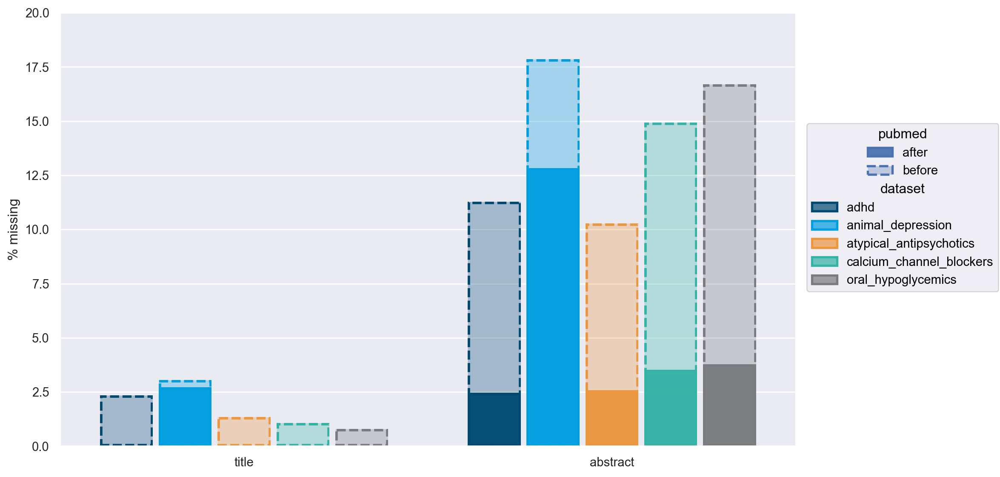

In [31]:
# plot the reduction in missing data
(
    so.Plot(data=missings_melted, x='type', y='missing', alpha='pubmed', edgestyle='pubmed', color='dataset', text='missing')
    .add(so.Bar(edgewidth=2), so.Dodge(by=['color'], gap=0.1))
    .label(x='', y='% missing', legend='Test')
    .scale(color=so.Nominal(color_palette(COLOR_CODES[:5])))
    .layout(size=(10, 6))
    .limit(y=(0,20))
)

#### Conclusion: Missing Data
The call to the PubMed interface reduced the amount of missing titles and abstracts across all datasets.

All but the datasets on animal depression and oral hypoglycemics, result in no missing titles after the api call. The reduction in missing abstracts ranged from three to fifteen percent.

## Noise

In the context of title/abstract-screening we refer to 'noise' as elements within the text that do not contribute information which is relevant to decide on its eligibility, or such, that the supervised machine learning model can not make sense out of.

Such noise could contain markup elements, used for formatting online-texts, texts in languages other than English and others.

### Non-English Languages

Our supervised machine learning models will be trained on the majority of English texts.
As such, they will struggle to classify texts in other languages.

We therefore want to inspect whether there are texts in other languages, and, if so, how many.

#### Amount of non-English Texts

##### Titles

In [32]:
# filter non-english titles
non_english_titles = all_datasets.filter(
    pl.col('language_title') != 'en'
)

In [33]:
# calculate the percentage of non-english titles
percentage = round(len(non_english_titles) / len(all_datasets), 4) * 100

# print the percentage and the distribution of non-english titles
print('Fast-langdetect detected',
      len(non_english_titles),
      f'({percentage:.2f}%)', 
      'non-english titles in the datasets'
    )

# distribution of non-english titles
non_english_titles.select('dataset').to_series().value_counts()

Fast-langdetect detected 100 (1.76%) non-english titles in the datasets


dataset,count
str,u32
"""calcium_channel_blockers""",24
"""adhd""",22
"""oral_hypoglycemics""",14
"""atypical_antipsychotics""",19
"""animal_depression""",21


##### Abstracts

In [34]:
# filter non-english abstracts
non_english_abstracts = all_datasets.filter(
    pl.col('language_abstract') != 'en'
)

In [35]:
# calculate the percentage of non-english abstracts
percentage = round(len(non_english_abstracts) / len(all_datasets), 4) * 100

# print the percentage and the distribution of non-english abstracts
print('Fast-langdetect detected',
      len(non_english_abstracts),
      f'({percentage:.2f}%)', 
      'non-english abstracts in the datasets'
    )

# distribution of non-english abstracts
non_english_abstracts.select('dataset').to_series().value_counts()

Fast-langdetect detected 27 (0.47%) non-english abstracts in the datasets


dataset,count
str,u32
"""adhd""",5
"""animal_depression""",14
"""calcium_channel_blockers""",4
"""atypical_antipsychotics""",4


#### Samples of non-English Texts

#### German

In [36]:
abstracts_german = [
    (adhd, 759),
    (animal_depression, [266, 848, 1162, 1250, 1521, 1644, 1919])
]

print_abstracts(abstracts_german)

Die Periduralanalgesie und die patientenkontrollierte intravenöse Analgesie (PCA) werden meist als Goldstandards der postoperativen Schmerztherapie einander gegenübergestellt. In dieser Studie sollte 

1. Endoxan hemmt, insbesondere während der Erstimmunisierung, die Ausbildung von Antikörpern gegen Brucella abortus; 6-Mercaptopurin hat einen weitaus geringeren Effekt. 2. Beide Substanzen vermindern

Die Neuroleptika Melleril ®, Sordinol ® und Fluanxol ® senken bei Mäusen dosisabhängig Körpertemperatur und O2-Verbrauch und erhöhen bei i.p. Applikation vor sub-letaler oder letaler Bestrahlung mit γ

Es wird gezeigt, dass Phythämagglutinin (PHA) die Antikörperbildung gegenBrucella abortus bei der Maus merklich herabsetzt, aber nur dann, wenn PHA vor dem Antigenstimulus verabreicht wird und die imm

Piperonylbutoxyd, Methylendioxylanilin, Methyleugenol, Safranol und Vanillylamin bewirken eine additive Hemmung der Funktion mikrosomaler Enzyme in Mäusen, wenn sie zusammen in Dosen verabreic

#### French

In [37]:
abstracts_french = [
    (animal_depression, [968]),
    (calcium_channel_blockers, [590])
]

print_abstracts(abstracts_french)

La toxoplasmose acquise est une infection parasitaire qui touche l’ensemble des cellules cérébrales lors de la phase aiguë. Il paraît donc surprenant que cette infection soit sans conséquence sur le f

Tester l’hypothèse que le sulfate de magnésium (SO4Mg), habituellement administré pour protéger le myocarde et réduire l’incidence des arythmies en chirurgie cardiaque, était en mesure de contrôler le



#### Spanish

In [38]:
abstracts_spanish = [
    (animal_depression, [675]),
    (calcium_channel_blockers, [348])
]

print_abstracts(abstracts_spanish)

El Sulpiride in vitro a la concentración de 1×10−2 M disminuye el consumo de Oxígeno en cortes de cerebro de rata. El exceso de potasio o ausencia de calcio en el medio de incubación, no modifican est

Mediante este estudio se ha pretendido: a) identificar y caracterizar los problemasrelacionados con la medicación (reacciones adversas, fracasos terapéuticos relacionados con ladosis e intoxicaciones)



#### Portuguese, Italian, Japanese

In [39]:
abstracts_other_languages = [
    (adhd, [785]), # Portuguese
    (animal_depression, [421]), # Italian
    (atypical_antipsychotics, [99]) # Japanese
]

print_abstracts(abstracts_other_languages)

A sindrome de hiperatividade com déficit de atenção (SHDA) constitui distúrbio comum na infância, podendo advir de fatores exógenos ou endógenos, os quais são responsáveis por comprometimento cerebral

Inoculando in embrioni di pollo di 4 giorni di sviluppo un inibitore dell'anidrasi carbonica (4, 5-Dicloro-1, 3-Benzendisolfonamide) o un suo derivato inattivo nel quale un atomo di idrogeno dei 2 gru

シグマ受容体拮抗物質に関する最近の研究成果を精神分裂病治療薬との関連でまとめた．選択的シグマ1受容体拮抗物質であるNE-100はphencyclidine(PCP)誘発異常行動改善作用および認知障害改善作用を有するが，ドパミンアゴニスト誘発行動には影響を及ぼさず，カタレプシー惹起性も認められない．NE-100の作用機序はN-methyl-D-aspartate(NMDA)/PCP受容体イオンチャネ



#### Special Case: Multilingual

An especially challenging case is a bilingual abstract, that contains both German and English text:

> **Deletion Note**
> 
> Bilingual abstracts are present within the ``pancreatic_surgery`` dataset which we can not publish

#### Conclusion: Non-English Texts
A variety of languages other than English is present across the titles and abstracts. However, the language detection has an accuracy of roughly only 75 % and misclassifies English texts. The language detection seems to struggle especially with short samples of text and medical terms.

According to the language detection, roughly one percent of all the articles have a title in a Non-English language. Non-English abstracts are present in less than one percentile of all artiles.

Correcting misclassified languages requires manual screening.

## List of Authors
Some entries contain a list of authors where there should be an abstract:

In [40]:
# some examples of abstracts that contain lists of authors
abstracts_authors = [
    (calcium_channel_blockers, [599, 863]),
    (atypical_antipsychotics, [917, 976] )
]

print_abstracts(abstracts_authors)

van den Toren, E. Wout; de Vries, Rob J. M.; Portegies, Mireille C. M.; Blanksma, Paul K.; van Gilst, Wiek H.*; Hillege, Hans J.; van Veldhuisen, Dirk J.; Lie, Kong I. Author Information

Grandi, Anna M.; Bignotti, Massimo; Gaudio, Giovanni; Zanzi, Paolo; Guasti, Luigina; Venco, Achilla Author Information

Faustman, William O. PhD; Ringo, David L. MD, PhD; Lauriello, John MD; Lim, Kelvin O. MD; Pfefferbaum, Adolf MD; Bardgett, Mark E. PhD; Csernansky, John G. MD Author Information

Kern, Robert S. PhD; Marshall, Barringer D. MD; Kuehnel, Timothy G. PhD; Mintz, Jim PhD; Hayden, Jeffrey L. BA; Robertson, Mary Jane MS; Green, Michael F. PhD Author Information



In some cases, this could be retraced to faulty entries in the OpenAlex index:

![alt text](openalex_authors.png "Title")

## HTML

In [41]:
# some examples of abstracts that contain HTML elements
abstracts_html = [
    (calcium_channel_blockers, 24),
    (adhd, [456])
]

print_abstracts(abstracts_html)

<h3>Objective:</h3> To report an atypical presentation of Lance-Adams Syndrome presenting from severe respiratory depression rather than cardiac arrest and to highlight the importance of distinguishin

<b><i>Objective:</i></b> To evaluate the efficacy and safety of risperidone in children and adults with Tourette syndrome. <b><i>Methods:</i></b> This was an 8-week, randomized, double-blind, placebo-



## Markdown

In [42]:
# examples of abstracts that contain markdown elements
abstract_markdown = [
    (calcium_channel_blockers, [44])
]

print_abstracts(abstract_markdown)

### Table of contents

It is important that the medical profession play a significant role in critically evaluating the use of diagnostic procedures and therapies in the management or prevention of 



## Special Characters

In [43]:
# examples of abstracts that contain special characters
abstract_special_characters = [
    (animal_depression, [190])
]

print_abstracts(abstract_special_characters)

✓ Adult Fisher 344 rats were subjected to a unilateral impact to the dorsal cortex above the hippocampus at 3.5 m/second, resulting in a 2-mm cortical depression. This caused severe cortical damage an



## Abbreviations

> **Deletion Note**
>
> Examples with abbreviations were taken from the ``pancreatic surgery`` dataset.

## Paragraph Labels

In [44]:
# examples of abstracts that contain paragraph labels (e.g., "Objective")
abstract_paragraph = [
    (atypical_antipsychotics, [24])
]

print_abstracts(abstract_paragraph)

RATIONALE: The atypical neuroleptic clozapine induces specific electroencephalogram changes, which have not been investigated using the technique of magnetoencephalography (MEG).
OBJECTIVE: The prese



## Incomplete Abstracts
Some abstracts are incomplete and end mid-sentence, which becomes visible when printing only their last 250 characters:

> **Deletion Note**
>
> Examples with incomplete abstracts were taken from the ``pancreatic surgery`` dataset.

#### Conclusion: Noise
There are different kinds of noise present in the data. That noise originates from the original sources, possibly because of mixed up data fields or formatting errors.

It is possible to detect and remove non-English abstracts. Other noise such as special characters, or markups like markdown or html can be removed using regular expressions or dedicated libraries. 

Detecting and handling other types of noises, such as lists of authors in place of abstracts, incomplete abstracts, or abbreviations is not as trivial on the other hand

## Word Frequencies (Word Cloucs)
Create and plot a word cloud for each dataset to visualize words which frequently appear throughout them and thus become especially relevant for supervised machine learning models:

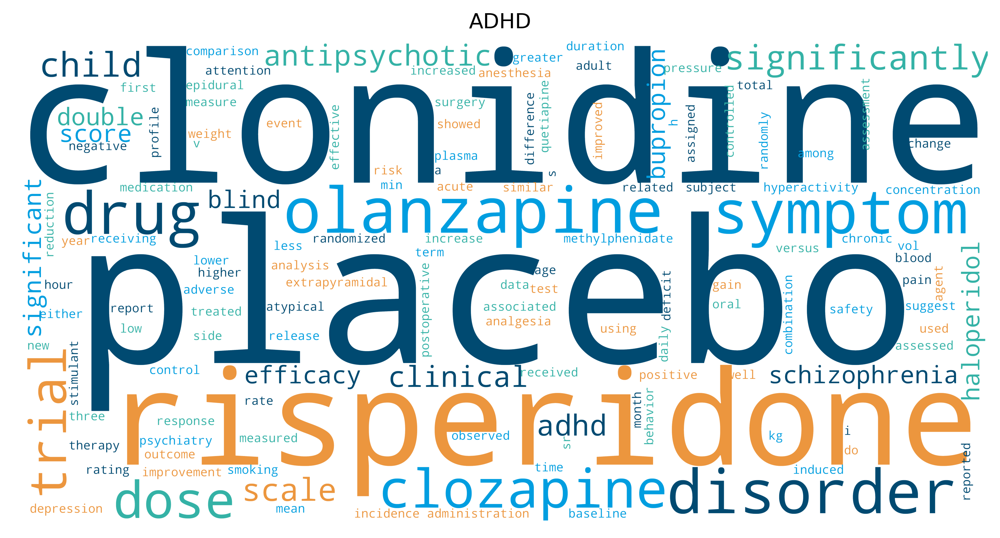

In [45]:
adhd_cloud = word_cloud_from_dataframe(adhd, columns=['title', 'abstract'])
plot_word_cloud(adhd_cloud, 'ADHD')

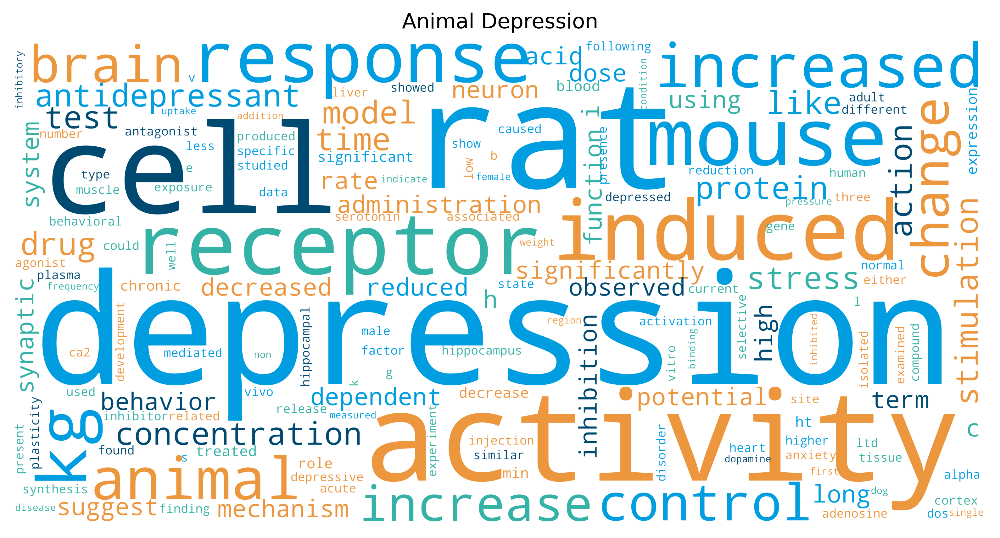

In [46]:
animal_depression_cloud = word_cloud_from_dataframe(animal_depression, columns=['title', 'abstract'])
plot_word_cloud(animal_depression_cloud, 'Animal Depression')

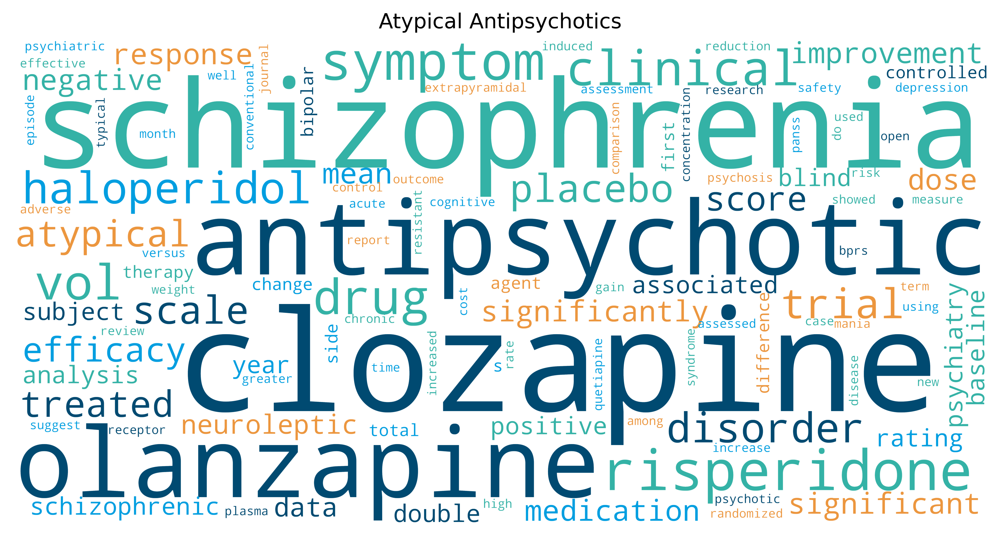

In [47]:
atypical_antipsychotics_cloud = word_cloud_from_dataframe(atypical_antipsychotics, columns=['title', 'abstract'])
plot_word_cloud(atypical_antipsychotics_cloud, 'Atypical Antipsychotics')

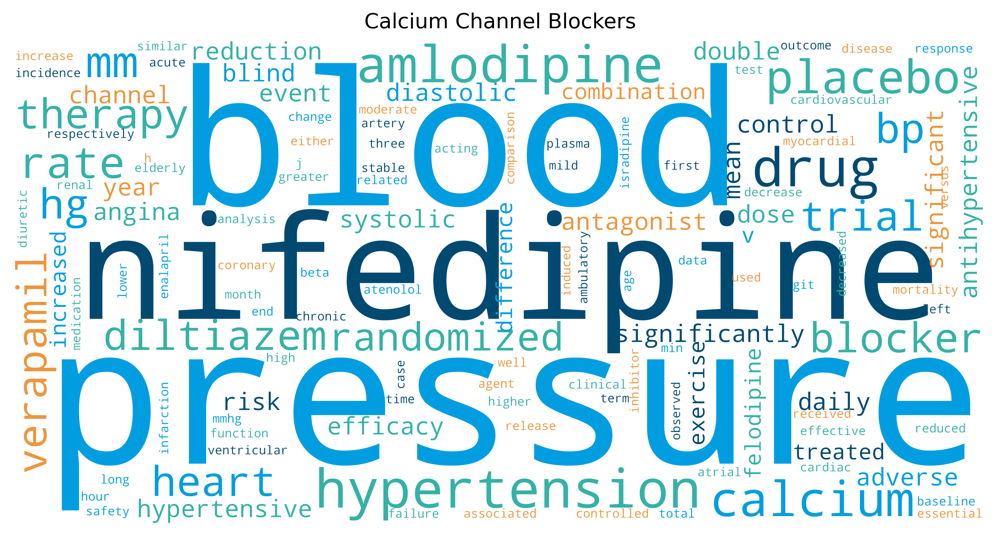

In [48]:
calcium_channel_blockers_cloud = word_cloud_from_dataframe(calcium_channel_blockers, columns=['title', 'abstract'])
plot_word_cloud(calcium_channel_blockers_cloud, 'Calcium Channel Blockers')

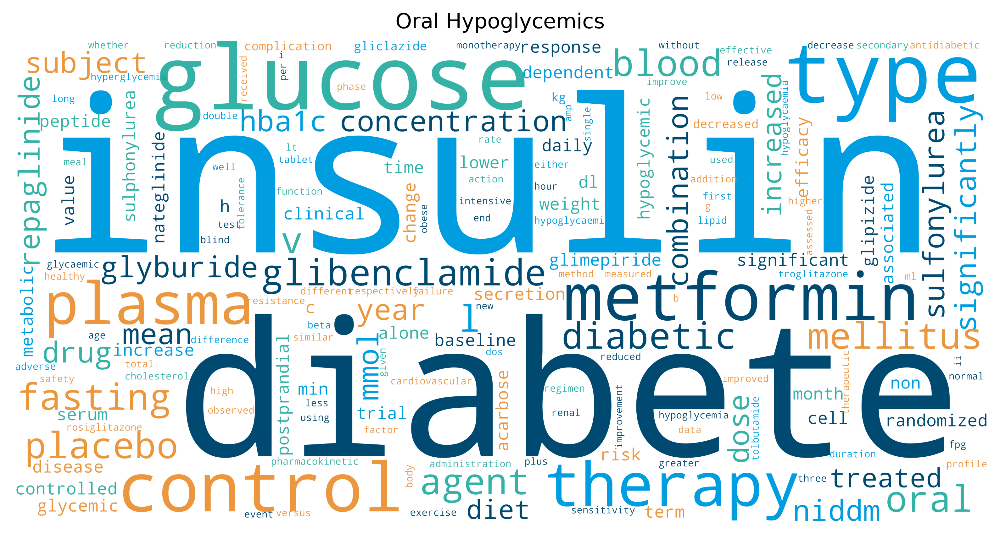

In [49]:
oral_hypoglycemics_cloud = word_cloud_from_dataframe(oral_hypoglycemics, columns=['title', 'abstract'])
plot_word_cloud(oral_hypoglycemics_cloud, 'Oral Hypoglycemics')

### Subplot
Embed all wordclouds within one figure

In [50]:
wordclouds = {
    'ADHD': adhd_cloud,
    'Animal Depression': animal_depression_cloud,
    'Atypical Antipsychotics': atypical_antipsychotics_cloud,
    'Calcium Channel Blockers': calcium_channel_blockers_cloud,
    'Oral Hypoglycemics': oral_hypoglycemics_cloud,
}

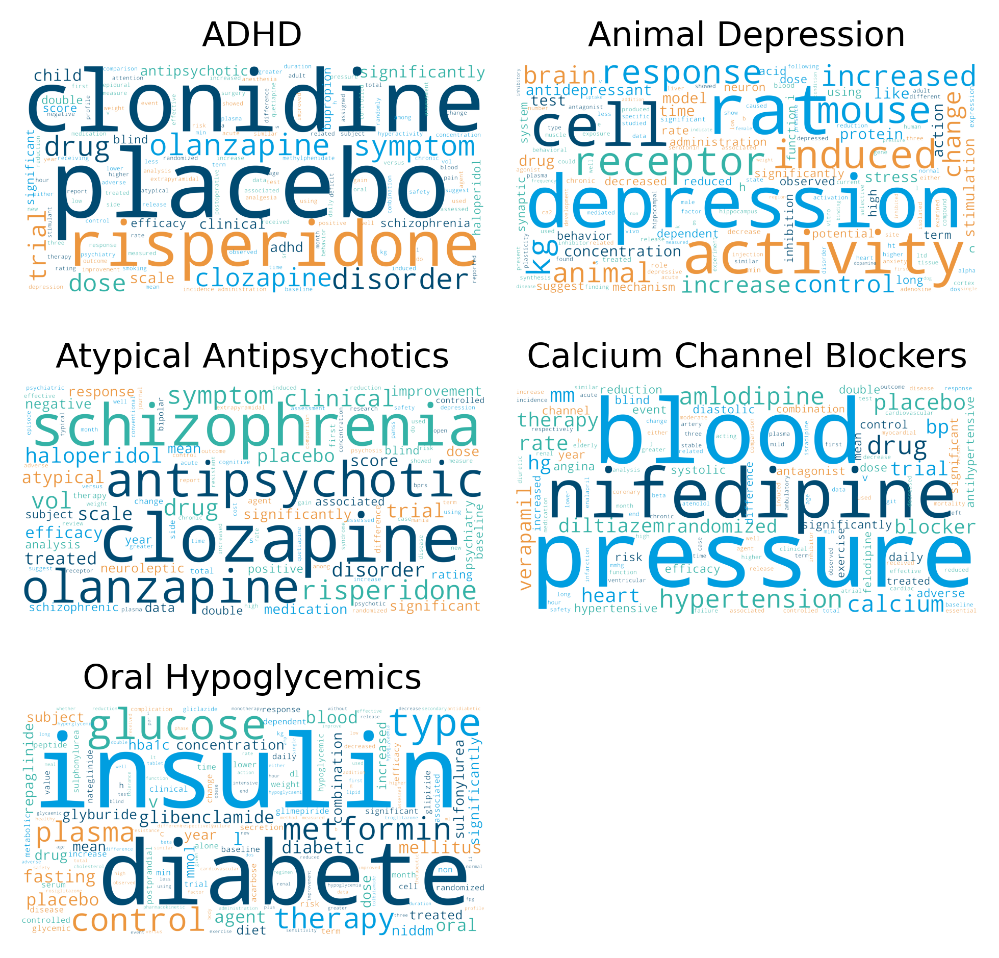

In [52]:
# Create a figure with 3 rows and 2 columns, and set the dpi for higher quality
fig, axes = plt.subplots(3, 2, figsize=(5,5), dpi=400)

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Plot each word cloud in the corresponding subplot
for ax, (title, wordcloud) in zip(axes, wordclouds.items()):
    ax.imshow(wordcloud, interpolation='bilinear')
    ax.set_title(title)
    ax.axis('off')  # Hide the axes

axes[5].set_visible(False)  # Hide the last unused subplot

# Adjust layout
plt.tight_layout()
#plt.subplots_adjust(wspace=None, hspace=None)  # Adjust wspace and hspace to reduce gaps

plt.show()

#### Conclusion: Word Frequencies
The wordclouds indicate that filtering out common uninformative stopwords results in a collection of terms characteristic to the subjects of the datasets.